# Chest-X-Ray-Image_Segmentation_ResUNet Project
Lung segmentation for chest X-Ray images with ResUNet. In addition, feature extraction and tuberculosis cases diagnosis has developed.

# Goal:
The project focuses on semantic segmentation of chest X-ray images with a specific emphasis on lung segmentation. It begins by loading and preprocessing the dataset, which includes images from the Shenzhen and Montgomery datasets, as well as a separate test set from NIH. To enhance the diversity of the training data, data augmentation techniques like contrast adjustment and noise addition are applied. The core of the project lies in the implementation of a Residual U-Net architecture designed for semantic segmentation, capturing hierarchical features and leveraging skip connections. Custom metrics, including dice coefficient and jaccard coefficient, along with corresponding loss functions, guide the model's training. The training process involves minimizing the defined loss functions using the Adam optimizer, and learning rate reduction and model checkpointing are implemented as callbacks. Visualizations of training and validation metrics over epochs aid in assessing model performance. The trained model is evaluated on both the validation set and a separate test set, visualizing predictions alongside original images and actual masks. The project also integrates MLflow for experiment tracking and model versioning, enhancing reproducibility and experiment management. The code is well-documented, and visualizations, such as the U-Net architecture plot, contribute to a comprehensive understanding of the workflow. Future considerations may include extending the project to incorporate additional datasets, fine-tuning hyperparameters, or exploring alternative pre-trained models for feature extraction.

# Task:
The goal of this project is to develop a robust and accurate semantic segmentation model for chest X-ray images, with a specific focus on delineating lung regions. Semantic segmentation involves classifying each pixel in an image, and in the context of chest X-rays, accurate segmentation of lung areas is crucial for various medical applications, including disease diagnosis and treatment monitoring. The project aims to leverage a Residual U-Net architecture, a sophisticated neural network design known for its effectiveness in image segmentation tasks. The model is trained on a diverse dataset, incorporating images from the Shenzhen and Montgomery datasets, and tested on a separate NIH dataset. To enhance the model's generalization capabilities, data augmentation techniques, such as contrast adjustment and noise addition, are applied during training. The project also incorporates MLflow for experiment tracking, enabling efficient management and versioning of different model iterations. The ultimate objective is to provide a reliable tool for automating the segmentation of lung regions in chest X-ray images, contributing to advancements in medical imaging and diagnosis. The comprehensive nature of the project, from dataset preprocessing to model evaluation and integration of experiment tracking, reflects a holistic approach toward achieving this  goal. 

# Dataset:
The dataset used in this project comprises chest X-ray images, specifically focusing on lung segmentation. The dataset is sourced from multiple repositories, including the Shenzhen, Montgomery, and NIH datasets. The Shenzhen dataset consists of chest X-rays with associated mask images indicating lung regions, obtained from tuberculosis-positive and negative cases. The Montgomery dataset provides X-ray images from tuberculosis screening, along with corresponding mask images for lung segmentation. The NIH dataset, used for testing, contains a diverse set of chest X-ray images.
https://www.kaggle.com/code/bonhart/chest-x-ray-eda-lung-segmentation/input

The images are preprocessed to ensure consistency and enhance model performance. This involves resizing the images to a uniform dimension of 256x256 pixels. The masks associated with the images are utilized for training the model to perform binary segmentation, distinguishing between lung and non-lung regions. The training dataset is further augmented using techniques such as contrast adjustment and noise addition to improve the model's ability to handle variations in input data.

The comprehensive nature of the dataset, incorporating images from multiple sources and ensuring a balance between positive and negative cases, aims to enhance the model's generalization capabilities. By training on a diverse set of chest X-ray images, the model is expected to learn intricate patterns associated with lung segmentation, contributing to its accuracy and robustness in real-world applications.

## Exploratory data analysis on chest-x-ray & lung-segmentation

In [19]:
import os
import glob
import re

import numpy as np
import pandas as pd

import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import ImageGrid
import tensorflow as tf

from glob import glob
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns


# Steps:
**Exploratory data analysis:**

work with tabular data:

work with images

**Training process:**

train loop
train history

**Test**

In [2]:
TAB_DATA_PATH = "../input/chest-xray-masks-and-labels/Lung Segmentation/ClinicalReadings/"
IMGS_PATH = '../input/chest-xray-masks-and-labels/Lung Segmentation/CXR_png/'
MASKS_PATH = "../input/chest-xray-masks-and-labels/Lung Segmentation/masks/"
TEST_IMG_PATH = "../input/chest-xray-masks-and-labels/Lung Segmentation/test/"
IMG_SIZE = 128

In this section of code, the exploratory data analysis (EDA) for the chest X-ray and lung segmentation project is conducted. The code is organized into distinct steps, starting with the overall structure of EDA, followed by working with tabular data and images.The entire section of code provides a thorough exploration of the dataset, covering aspects such as TB case distribution, patient demographics, and age distribution. Visualizations enhance the understanding of these aspects, contributing to the overall analysis of the chest X-ray and lung segmentation project dataset.

# Data Statistics and Overview

In [3]:
# Get the list of files in the specified directories
images = os.listdir(IMGS_PATH) # List of X-ray images
masks = os.listdir(MASKS_PATH) # List of masks related to the images
readings = os.listdir(TAB_DATA_PATH) # List of clinical readings or tabular data

# Display the total number of files in each category
print('Total number of x-ray images:',len(images))
print('Total number of masks:',len(masks))
print('Total number of clinical readings:',len(readings))

Total number of x-ray images: 800
Total number of masks: 704
Total number of clinical readings: 800


These lines of code are segregating X-ray images into two categories: tuberculosis positive cases (tb_positive) and tuberculosis negative cases (tb_negative).

In [4]:
# Filter X-ray images based on the presence of tuberculosis
tb_positive = [image for image in images if image.split('.png')[0][-1]=='1']
tb_negative = [image for image in images if image.split('.png')[0][-1]=='0']

# Display the count of tuberculosis positive and negative cases
print('There are %d tuberculosis positive cases.' % len(tb_positive))
print('There are %d tuberculosis negative cases.' % len(tb_negative))

There are 394 tuberculosis positive cases.
There are 406 tuberculosis negative cases.


The np.random.choice function is employed to randomly select one image from each category. The display function is then used to show the selected images along with informative print statements indicating whether each image is positive or negative for tuberculosis.

Image CHNCXR_0415_1.png is positive on tuberculosis.


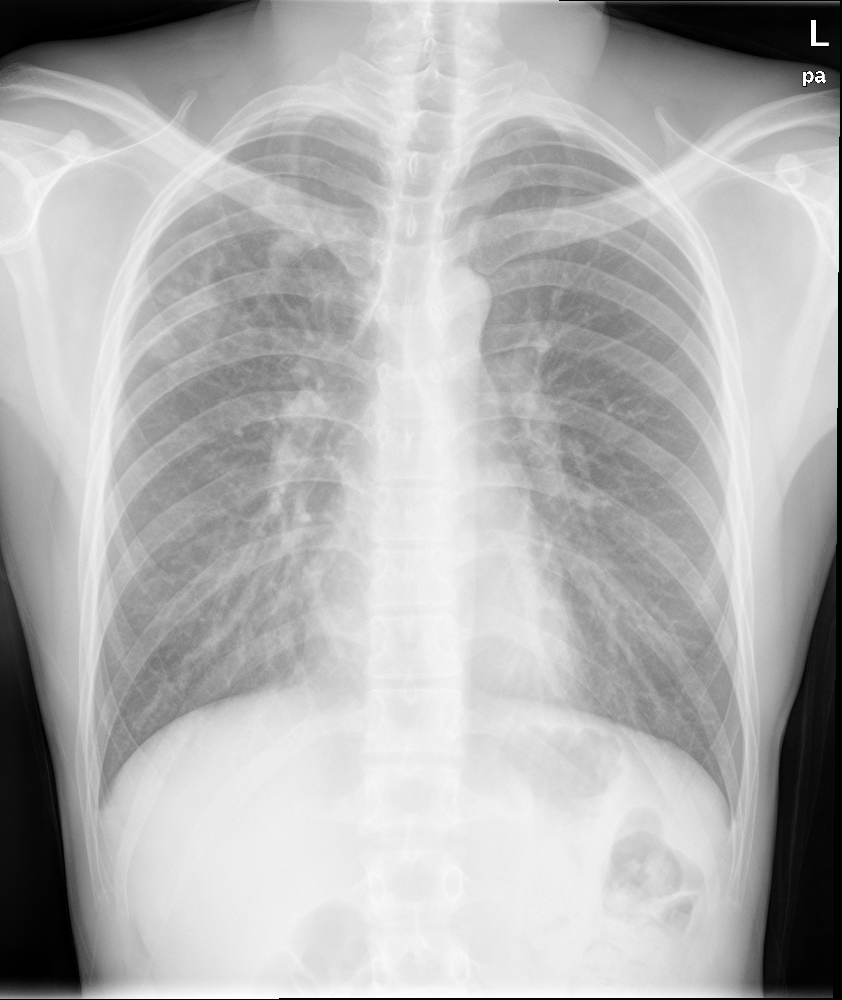

Image MCUCXR_0042_0.png is negative on tuberculosis.


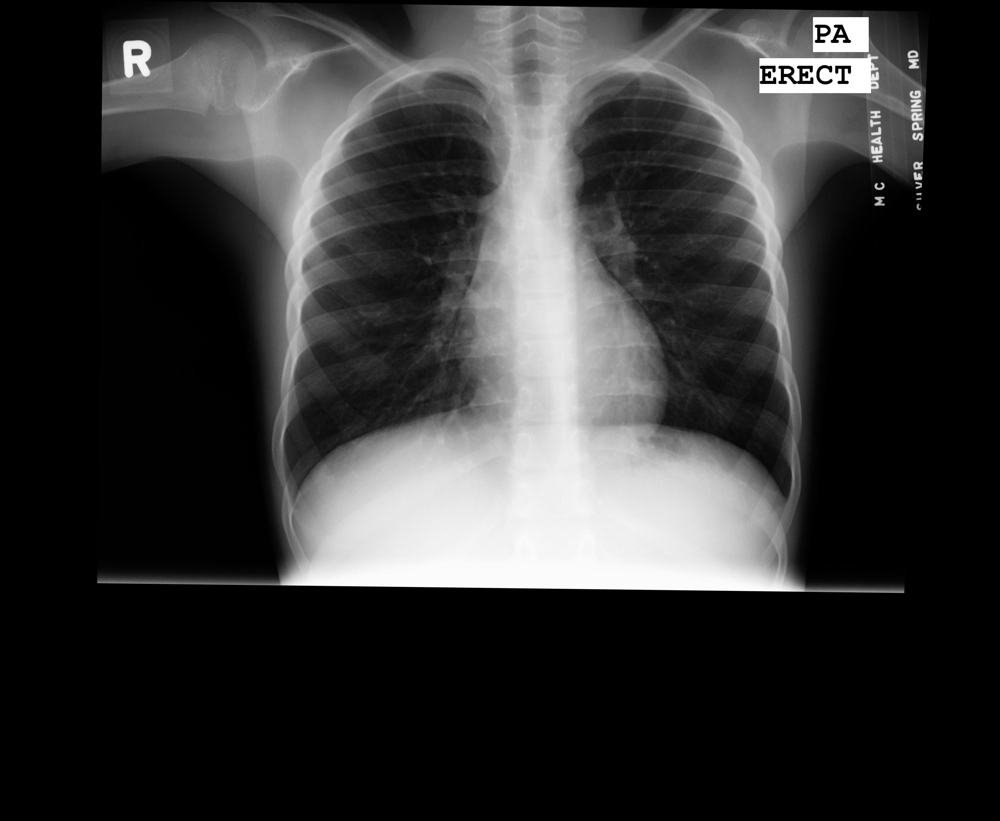

In [5]:
# Import necessary libraries for displaying images
from IPython.display import Image

# Randomly select one tuberculosis positive and one negative image
pos_image = np.random.choice(tb_positive,1)
neg_image = np.random.choice(tb_negative,1)

# Display the randomly selected tuberculosis positive image
print("Image %s is positive on tuberculosis." % pos_image[0])
display(Image(os.path.join("../input/chest-xray-masks-and-labels/Lung Segmentation/CXR_png",pos_image[0]),width=256,height=256))

# Display the randomly selected tuberculosis negative image
print("Image %s is negative on tuberculosis." % neg_image[0])
display(Image(os.path.join("../input/chest-xray-masks-and-labels/Lung Segmentation/CXR_png",neg_image[0]),width=256,height=256))

The list of image names to extract the tuberculosis state (positive or negative) and then creates a pandas DataFrame (img_df) to organize this information. The DataFrame includes columns for image names, tuberculosis state, image paths, source information, and text paths. The head() function is used to display the first few rows of the DataFrame.

In [6]:
# Extract tuberculosis state from image names
tb_state = [int(image.split('.png')[0][-1]) for image in images]

# Create a DataFrame with image names, tuberculosis state, image paths, source, and text paths
img_df = pd.DataFrame({'Image_name':images, 'TB_state': tb_state})
img_df['Path'] = img_df['Image_name'].map(lambda x: "../input/chest-xray-masks-and-labels/Lung Segmentation/CXR_png/"+x)
img_df['Source'] = img_df['Image_name'].map(lambda x: x.split('_')[0])
img_df['Text_path'] = img_df['Image_name'].map(lambda x: "../input/chest-xray-masks-and-labels/Lung Segmentation/ClinicalReadings/"+x.split('.png')[0]+'.txt')

# Display the first few rows of the DataFrame
img_df.head()

,Image_name,TB_state,Path,Source,Text_path
0,CHNCXR_0092_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...
1,CHNCXR_0322_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...
2,CHNCXR_0304_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...
3,CHNCXR_0572_1.png,1,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...
4,CHNCXR_0547_1.png,1,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...


This part processes the clinical readings from text files and extracts information about age, gender, and description. It then adds these columns to the existing DataFrame (img_df).

In [7]:
# Initialize empty lists to store age, gender, and description information
ages=[]
genders=[]
descriptions=[]

# Iterate through the text files in the 'Text_path' column of the DataFrame
for txt in img_df.Text_path.tolist():
    # Read lines from the text file
    lines = [line for line in open(txt,'r')]
    
    # Check if 'Patient's Sex:' is present in the first line
    if "Patient's Sex:" in lines[0]:
       
        gender = lines[0][lines[0].index("Patient's Sex:")+len("Patient's Sex:")+1]
        genders.append(gender)
        start = lines[1].index("Patient's Age:")
        length = len("Patient's Age:")
        age = int(lines[1][start+length+2:start+length+4])
        ages.append(age)
        
        # Extract and store the description
        description = ' '.join(lines[2:]).strip()
        descriptions.append(description)
    else:
        
        # If 'Patient's Sex:' is not present, infer gender and age from the first line
        if "male" or "MALE" in lines[0]:
            gender = 'M'
            genders.append(gender)
        else:
            gender = 'F'
            genders.append(gender)
            
        # Infer age from the first line based on different patterns    
        if "yrs" in lines[0]:
            start = lines[0].index("yrs")
            age = int(lines[0][start-2:start])
            ages.append(age)
        elif "yr" in lines[0]:
            start = lines[0].index("yr")
            age = int(lines[0][start-2:start])
            ages.append(age)
        else:
            ages.append(np.NaN)
            
        # Extract and store the description
        description = ' '.join(lines[1:]).strip()
        descriptions.append(description)

        
# Add age, gender, and description columns to the DataFrame        
img_df['Age'] = ages
img_df['Gender'] = genders
img_df['Description'] = descriptions

# Add age, gender, and description columns to the DataFrame
img_df.head()

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
0,CHNCXR_0092_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,37.0,M,normal
1,CHNCXR_0322_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,38.0,M,normal
2,CHNCXR_0304_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,19.0,M,normal
3,CHNCXR_0572_1.png,1,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,57.0,M,bilateral PTB
4,CHNCXR_0547_1.png,1,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,24.0,M,Right PTB


This visualization is useful for understanding the distribution of tuberculosis states in the dataset, providing a visual representation of the imbalance or balance between positive and negative cases.

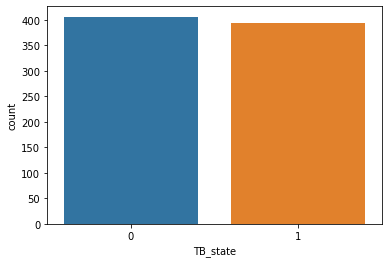

In [8]:
# Create a count plot of the 'TB_state' column in the DataFrame
sns.countplot(x='TB_state', data=img_df)

The code helps in exploring how many images are available for each unique source in the dataset, contributing to a better understanding of the data distribution.

In [9]:
# Group the DataFrame 'img_df' by the 'Source' column and count the number of occurrences of each group

img_df.groupby(by='Source')['Image_name'].count()

Source
CHNCXR    662
MCUCXR    138
Name: Image_name, dtype: int64

The count plot is a useful visualization for understanding the distribution of images across different sources. Each bar represents a unique source, and the height of the bar indicates the count of images associated with that source. This plot can help identify any imbalances or variations in the dataset based on the sources, providing insights into the dataset's composition.It is a quick and informative way to assess the overall distribution of images among different sources.

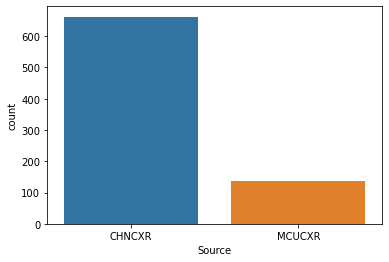

In [10]:
# Create a count plot using seaborn to visualize the distribution of images across different sources
sns.countplot(x='Source', data=img_df)

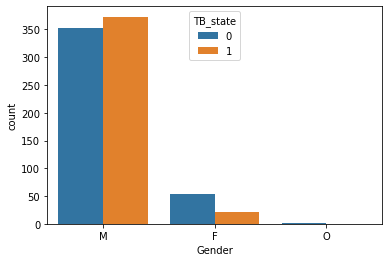

In [11]:
# Create a count plot using seaborn to visualize the distribution of TB states across different genders
sns.countplot(x='Gender', hue='TB_state', data=img_df)

In [12]:
# Calculate the total count of male gender in the dataset using boolean indexing
sum((img_df.Gender=='M'))

725

In [13]:
# Calculate the total count of female gender in the dataset using boolean indexing
sum((img_df.Gender=='F'))

74

Filters the DataFrame to show rows where the gender is labeled as 'O', providing insights into cases where gender information is labeled as 'Other/Unknown'.Identifying and extracting rows with gender labeled as 'O' is crucial for understanding the dataset's
gender labeling completeness. The 'O' category may represent cases where gender information is either unknown or falls outside conventional categories. Investigating these instances is essential for data quality assessment and can inform decisions on how to handle or interpret cases with missing or unconventional gender labels.

In [14]:
# Extract rows where the gender is labeled as 'O' (Other/Unknown) in the DataFrame
img_df[img_df.Gender=='O']

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
315,MCUCXR_0080_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,MCUCXR,../input/chest-xray-masks-and-labels/Lung Segm...,5.0,O,normal


In [15]:
# Calculate and print the TB positive rate for male and female patients

print('TB positive rate of male patients:',sum((img_df.Gender=='M') & (img_df.TB_state==1)) / sum(img_df.Gender=='M'))
print('TB positive rate of female patients:',sum((img_df.Gender=='F') & (img_df.TB_state==1)) / sum(img_df.Gender=='F'))

TB positive rate of male patients: 0.5144827586206897
TB positive rate of female patients: 0.28378378378378377


Identifying and exploring entries in the dataset where the age information is not available, acknowledging the potential gaps in the dataset and highlighting the importance of complete demographic information for comprehensive medical analysis.

In [16]:
# Filter rows where the Age column is null and display the corresponding entries
img_df[img_df.Age.isnull()]

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
528,CHNCXR_0018_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,NaN,M,normal
539,CHNCXR_0115_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,NaN,M,normal
575,CHNCXR_0201_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,NaN,M,normal
625,CHNCXR_0202_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,NaN,M,normal


In [17]:
# Explore and print text information for entries with missing age values
null_age_imgs = img_df[img_df.Age.isnull()].Text_path
for txt in null_age_imgs:
    lines = [line for line in open(txt,'r')]
    print(lines)

['male 42\n', 'normal']
['male 16month\n', 'normal']
['male 16month\n', 'normal']
['female 64days\n', 'normal']


This code section manually imputes age values for specific entries in the DataFrame (img_df) using the loc accessor. The indices 446, 469, 535, and 660 are selected, and corresponding age values are assigned. After the imputation, the code checks if there are any remaining entries with missing age values and prints them. This imputation step is crucial for ensuring completeness in the dataset, especially when age information is essential for analysis or modeling.

In [21]:
# Impute missing age values for specific entries in the DataFrame

# Set age values for entries with specific indices
img_df.loc[446,'Age']=1
img_df.loc[469,'Age']=0
img_df.loc[535,'Age']=1
img_df.loc[660,'Age']=42

# Print the DataFrame entries with missing age values after imputation
img_df[img_df.Age.isnull()]

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
528,CHNCXR_0018_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,NaN,M,normal
539,CHNCXR_0115_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,NaN,M,normal
575,CHNCXR_0201_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,NaN,M,normal
625,CHNCXR_0202_0.png,0,../input/chest-xray-masks-and-labels/Lung Segm...,CHNCXR,../input/chest-xray-masks-and-labels/Lung Segm...,NaN,M,normal


A histogram of ages is created specifically for cases where TB_state is 1 (tuberculosis-positive). The seaborn distplot function is used for this visualization, and the parameter kde=False is set to exclude the kernel density estimate and display only the histogram. This plot aids in analyzing the age distribution among individuals who tested positive for tuberculosis, offering insights into potential age-related patterns in the dataset.

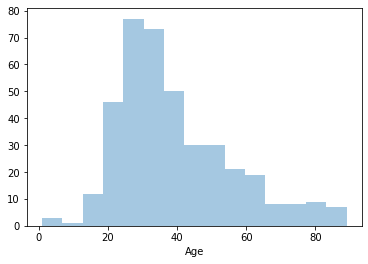

In [22]:
# Plotting a histogram of ages for tuberculosis-positive cases
sns.distplot(img_df[img_df.TB_state==1]['Age'], kde=False)

# Tabular Data

This function reads text files containing tabular data, extracts relevant information about sex and age, and organizes the data into a DataFrame. The resulting DataFrame is then saved to a CSV file named "raw_patients_info.csv". The function is flexible and can be used with different paths for tabular data. The extracted information can be useful for further analysis and understanding patient demographics in the context of the project.

In [23]:
# Function to extract patient information from tabular data text files and create a DataFrame

def get_df_with_patients_info(path=TAB_DATA_PATH):
    # Get a list of all text files in the specified path
    tab_data_txt = os.listdir(path)
    
    # Extract numeric IDs from the filenames, removing the ".txt" extension
    ids = ' '.join(map(str, tab_data_txt)).replace(".txt", "").split()
    
    # Initialize an empty list to store tabular data
    tabular_data = []

    
     # Iterate through each ID and corresponding text file
    for idx, one_diagnosis in zip(ids, tab_data_txt):
        #print(idx, one_diagnosis)
        with open(TAB_DATA_PATH + one_diagnosis) as f:
            info = []
            
            # Iterate through each line in the text file
            for line in f:
                
                # Convert the line to lowercase and remove leading/trailing whitespaces
                line = line.lower().strip()
            
                # Check for lines containing information about sex and age
                if "mal" in line and "normal" not in line and len(line) < 20:

                    # Process and extract sex and age information
                    line = line.replace(",", "")
                    line = line.replace(" ", "")

                    match = re.match(r"([a-z]+)([0-9]+)", line, re.I)
                    
                    # If there is a match, extract sex and age and append to the 'info' list# If there is a match, extract sex and age and append to the 'info' list
                    if match:
                        line = " ".join(match.groups())

                    sex, age = zip(line.split())
                    info.extend([list(sex), list(age)])
                    continue
                    
                # Append non-empty lines to the 'info' list
                info.append([line])
            
            
            # Remove empty lists, insert the ID at the beginning, and reshape the list
            info = [i for i in info if i != ['']]
            info.insert(0, [idx])
            info[3:] = [[i[0] for i in info[3:]]]
            info = [i[0] for i in info]
            
            # Remove empty lists, insert the ID at the beginning, and reshape the list
            tabular_data.append(info)
    
    # Create a DataFrame from the tabular data and save it to a CSV file
    pd.DataFrame(tabular_data, 
             columns=["Id", "Sex", "Age", "Diagnosis"]).to_csv("raw_patients_info.csv",
                                                               index=False)
# Call the function to generate the DataFrame with patient information            
get_df_with_patients_info()

This code section is crucial for loading the raw patient information into a format that can be easily manipulated and analyzed using the capabilities of the pandas library. The resulting DataFrame provides a structured representation of the patient data, which can be further explored and processed in subsequent steps of the project.

In [24]:
# Read the CSV file containing raw patient information into a DataFrame

raw_df = pd.read_csv("raw_patients_info.csv")
raw_df

,Id,Sex,Age,Diagnosis
0,CHNCXR_0499_1,male,25,right ptb
1,CHNCXR_0120_0,male,19,normal
2,CHNCXR_0192_0,male,24,normal
3,CHNCXR_0548_1,male,46,ptb
4,CHNCXR_0119_0,male,20,normal
...,...,...,...,...
795,CHNCXR_0197_0,male,36,normal
796,CHNCXR_0606_1,female,78,bilateral ptb
797,MCUCXR_0045_0,patient's sex: m,patient's age: 052y,normal
798,CHNCXR_0604_1,male,35,right ptb


### **Sex**

This code section again checking the gender distribution, it is useful for understanding the distribution of genders among the patients in the dataset. It provides a quick summary of how many male and female patients are present in the raw patient information, aiding in demographic analysis.

In [25]:
# Count the occurrences of each unique value in the "Sex" column of the raw patient information DataFrame

raw_df["Sex"].value_counts()

male                449
female              210
patient's sex: f     74
patient's sex: m     63
femal                 3
patient's sex: o      1
Name: Sex, dtype: int64

This code section is essential for data cleaning and normalization. It ensures that gender labels are uniform, making the data more reliable and facilitating downstream analysis related to gender demographics.

In [26]:
# Standardize and replace variations in gender labels, then count the occurrences of each gender

raw_df["Sex"] = raw_df["Sex"].replace({"patient's sex: f": "female",
                                       "patient's sex: m": "male",
                                       "femal": "female",
                                      "patient's sex: o": "male"})

raw_df["Sex"].value_counts()

male      513
female    287
Name: Sex, dtype: int64

# let's look at the distribution by this domain

This code section is responsible for visualizing the distribution of genders in the dataset, providing insights into the gender demographics. The annotations on the bars add quantitative information to the plot.

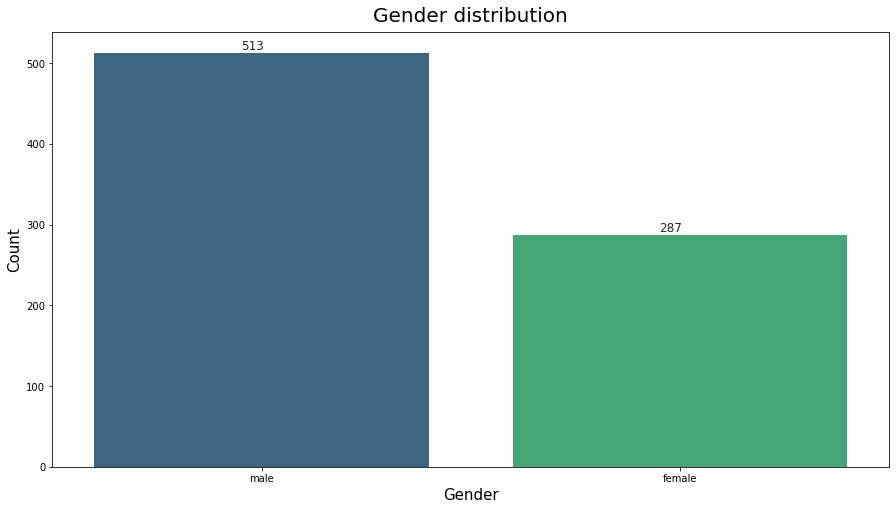

In [27]:
# Plotting gender distribution using a countplot with seaborn

fig, ax = plt.subplots(figsize=(15, 8))

age_dist = sns.countplot(raw_df["Sex"], palette="viridis",
             order = raw_df["Sex"].value_counts().index, ax=ax)

sns.set(font_scale=1)
age_dist.set_title('Gender distribution', fontsize=20, y=1.01)
age_dist.set_ylabel("Count", fontsize=15)
age_dist.set_xlabel("Gender", fontsize=15)
value = raw_df["Sex"].value_counts().values



for p, label in zip(age_dist.patches, value):
    age_dist.annotate(label, (p.get_x()+0.35, p.get_height()+4))

### **Age**
This section helps in understanding the distribution of ages in the dataset, providing insights into the age demographics of the patients. It can be useful for exploring the age-related patterns in the dataset.

In [28]:
# Counting the occurrences of each unique value in the "Age" column of the raw_df DataFrame
raw_df["Age"].value_counts()

28                     33
25                     32
24                     29
39                     25
23                     25
                       ..
patient's age: 042y     1
patient's age: 029y     1
patient's age: 073y     1
patient's age: 018y     1
patient's age: 085y     1
Name: Age, Length: 137, dtype: int64

We have text in rows, so we need to extract numbers from all string rows. This section is crucial for cleaning and transforming the "Age" column, making it more suitable for analysis by converting the extracted values to integers.

In [29]:

# Extracting numerical age values from the "Age" column using regular expressions

age_list = raw_df["Age"].apply(lambda line: re.findall(r'([1-9]\d+|[1-9])', line)).values

raw_df["Age"] = [int(age[0]) for age in age_list]
raw_df["Age"].value_counts()

25    35
28    35
24    31
32    29
30    29
      ..
7      1
75     1
88     1
73     1
77     1
Name: Age, Length: 82, dtype: int64

let's look at the distribution by this domain.This code section aims to provide a visual representation of the distribution of ages in the dataset and includes informative annotations about the descriptive statistics of the age distribution by domain.

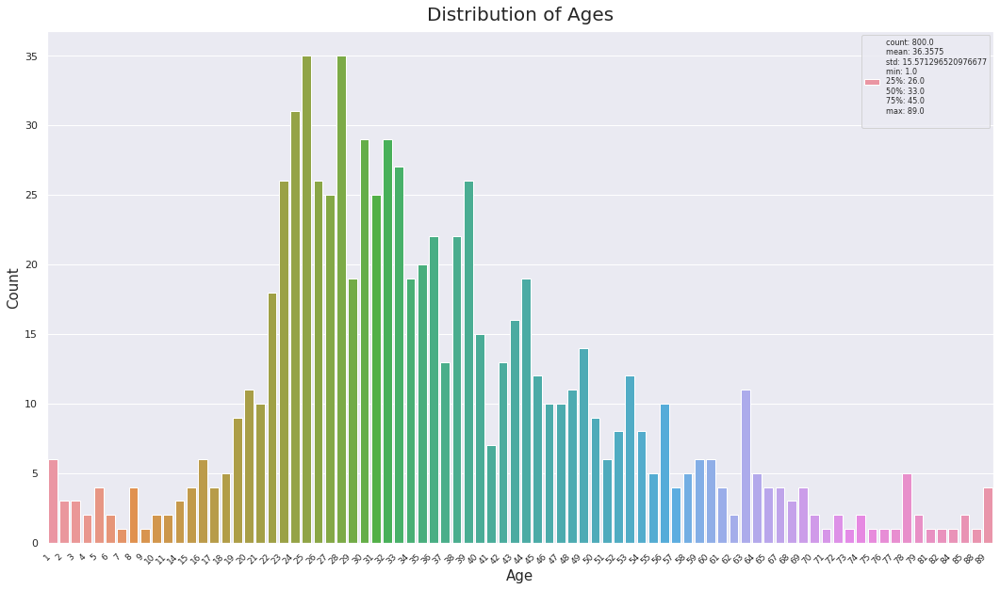

In [30]:
# Plotting the distribution of ages using a countplot


fig, ax = plt.subplots(figsize=(18, 10))

sns.countplot(raw_df["Age"], ax=ax)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=9);
ax.set_ylabel("Count", fontsize=15)
ax.set_xlabel("Age", fontsize=15)
ax.set_title("Distribution of Ages", fontsize=20, y=1.01)
              
annotate = raw_df["Age"].describe().to_dict()
annotate = [str(key) + ": " + str(value)+"\n" for key, value in annotate.items()]
ax.legend(["".join(annotate)], prop={'size': 8});

A visual comparison of the age distributions between male and female patients using KDE plots, allowing for an intuitive understanding of the data.

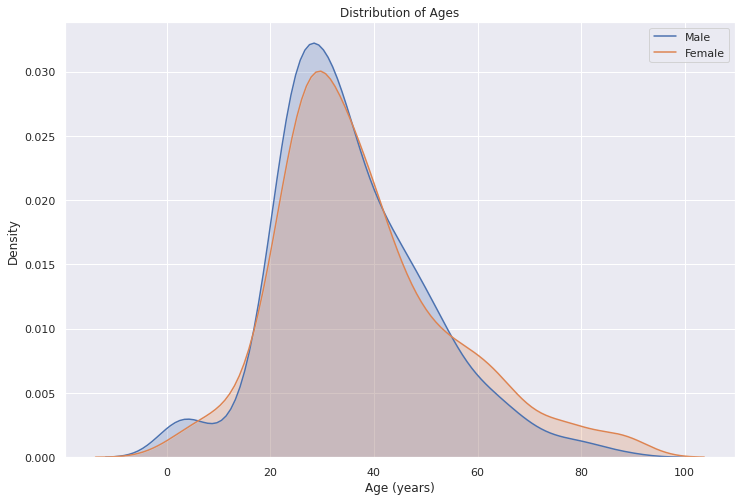

In [31]:
# Plotting Kernel Density Estimate (KDE) of age distribution for male and female patients

fig, ax = plt.subplots(figsize=(12, 8))

sns.kdeplot(raw_df.loc[raw_df['Sex'] == 'male', 'Age'], label = 'Male', ax=ax,shade=True)

sns.kdeplot(raw_df.loc[raw_df['Sex'] == 'female', 'Age'], label = 'Female', ax=ax, shade=True)

plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

# Summary and Overall EDA Structure of above section:

The EDA process is outlined with clear steps, including working with tabular data, images, the training process (train loop and train history), and testing.
Working with Tabular Data:

Tabular data related to clinical readings is loaded and processed. Information such as patient gender, age, and tuberculosis state is extracted. The data is organized into a DataFrame (img_df), containing relevant columns like 'Image_name,' 'TB_state,' 'Path,' 'Source,' 'Text_path,' 'Age,' 'Gender,' and 'Description.'
Exploring TB Cases:

The distribution of tuberculosis (TB) cases is analyzed, and random positive and negative TB cases are displayed with their respective images. The TB-positive rate is computed for both male and female patients.
Data Visualization:

Various visualizations are created to understand the dataset better. These include a countplot of TB cases, distribution of data sources, and a countplot of gender with respect to TB state. Additional statistics are provided, such as the count of male and female patients and the TB-positive rates for each gender.
Handling Missing Age Data:

Handling missing age information by examining text data from clinical readings. Specific lines with missing age information are displayed, and values are manually filled for certain instances.
Exploring Age Distribution:

The age distribution of patients is visualized using a histogram and a KDE plot. The distribution is further analyzed based on gender, with separate KDE plots for males and females. Descriptive statistics, including mean and quartiles, are annotated on the age distribution plot.
Working with Tabular Data (Additional Function):

A function (get_df_with_patients_info) is defined to extract patient information from the tabular data and save it to a CSV file (raw_patients_info.csv).
Analyzing Gender Distribution:

The distribution of patient gender is visualized using a countplot, and labels are added to the plot to display the count of each gender.
Processing Age Data:

Extracting numeric age values from text data in the 'Age' column. The age distribution is visualized using a countplot.
Age Distribution Visualization:

The age distribution is visualized with a histogram, and descriptive statistics are annotated on the plot.
Gender and Age KDE Plot:
Kernel Density Estimation (KDE) plots are created to visualize the distribution of ages based on gender. Separate KDE plots for males and females provide insights into the age distribution for each gender.

## Diagnosis
This is a simple yet effective way to explore and analyze the distribution of diagnoses in the raw patient information dataset (raw_df). The output provides a quick overview of the most common medical conditions present in the dataset.

In [36]:
# Count the occurrences of each diagnosis in the 'Diagnosis' column of the raw_df DataFrame
raw_df["Diagnosis"].value_counts()

normal                                                                                                                                                     405
bilateral ptb                                                                                                                                               61
right ptb                                                                                                                                                   45
ptb in the right upper field                                                                                                                                27
left ptb                                                                                                                                                    21
                                                                                                                                                          ... 
bilateral secondary ptb  with right pneumothor

This code section is responsible for utilizing a pre-trained ResNet50 model to extract features from a set of images, and it includes elements for performance measurement. The extracted features are stored in the features_array for further analysis or model training.Thismodel we will use latar part of this project.

In [33]:
# Load the ResNet50 model with pre-trained weights from ImageNet

import time
start = time.time()

import numpy as np
from tensorflow.keras.applications import ResNet50, InceptionV3, InceptionResNetV2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import preprocess_input
#from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input

resnet_weights_path = '../input/keras-pretrained-models/resnet50_weights_tf_dim_ordering_tf_kernels.h5'
base_model = ResNet50(weights='imagenet')
#base_model = InceptionResNetV2(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('avg_pool').output)

image_size = 224
img_paths = img_df.Path.tolist()
features_array = np.zeros((800,2048))

for i, img_path in enumerate(img_paths):
    img = image.load_img(img_path, target_size=(image_size, image_size))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    features = model.predict(x)
    features = features.reshape(2048,)
    features_array[i,:] = features
    
print('Running time: %.4f seconds' % (time.time()-start))

102973440/102967424 [==============================] - 3s 0us/step
Running time: 204.2980 seconds


This code section is responsible for utilizing a chosen pre-trained model (VGG16) to extract features from a set of images, and it includes elements for performance measurement. The extracted features are stored in the features_array for further analysis or model training.

In [38]:
import time
start = time.time()

import numpy as np
from tensorflow.keras.applications import ResNet50, InceptionV3, InceptionResNetV2, VGG19, VGG16,EfficientNetV2L
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import preprocess_input
#from tensorflow.keras.applications.efficientnet_v2 import preprocess_input
#from tensorflow.python.keras.applications.inception_v3 import preprocess_input
#from tensorflow.keras.applications.resnet50 import preprocess_input
#from tensorflow.python.keras.applications.inception_resnet_v2 import preprocess_input

#base_model = ResNet50(weights='imagenet')
#base_model = InceptionV3(weights='imagenet')
base_model = VGG16(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_pool').output)

image_size = 224
img_paths = img_df.Path.tolist()
features_array = np.zeros((800, 25088))

for i, img_path in enumerate(img_paths):
    img = image.load_img(img_path, target_size=(image_size, image_size))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    features = model.predict(x)
    features = features.reshape(25088,)
    features_array[i,:] = features
    
print('Running time: %.4f seconds' % (time.time()-start))

ImportError: cannot import name 'EfficientNetV2L' from 'tensorflow.keras.applications' (/opt/conda/lib/python3.7/site-packages/tensorflow/keras/applications/__init__.py)

# Data Modelling

This code creates a new DataFrame (df) where each row corresponds to an image. The columns include the extracted features, image names, and tuberculosis states. This structured DataFrame is useful for further analysis and modeling, as it consolidates both image features and associated metadata in a tabular format. The head(2) function is used to display the first two rows of the DataFrame for a quick inspection.

In [39]:
features_array.shape

(800, 2048)

In [40]:
df = pd.DataFrame(features_array)
df['Image_name'] = img_df.Image_name
df['TB_state'] = img_df.TB_state
df.head(2)

,0,1,2,3,4,5,6,7,8,9,...,2040,2041,2042,2043,2044,2045,2046,2047,Image_name,TB_state
0,3.306480,1.540533,0.0,1.153222,0.240695,0.563428,0.000000,0.000000,0.006234,0.032255,...,0.18747,0.000000,1.583098,2.982070,0.609356,0.000000,0.257410,0.101215,CHNCXR_0092_0.png,0
1,5.040666,1.520674,0.0,0.708324,0.059970,0.102703,0.563809,0.087942,0.000000,0.002205,...,0.64345,0.006834,2.081961,3.426808,0.419248,0.083304,0.489835,0.108258,CHNCXR_0322_0.png,0


This code section involves preparing the data for machine learning modeling using the scikit-learn library.This section  comprises several crucial steps for training, evaluating, and analyzing the performance of a neural network. The training details section establishes key training parameters, such as the number of epochs, a learning rate schedule for optimization, and a model checkpoint to save the best weights during training. The subsequent training output section reveals the model's progression over epochs, displaying training and validation metrics. This aids in assessing the model's convergence and performance trends. The model evaluation on the test set section loads the best-performing model based on validation accuracy and applies it to make predictions on the unseen test data. The confusion matrix and classification report generated in this section offer a comprehensive evaluation of the model's classification performance across different classes.The training set is used to train the model, and the testing set is used to assess how well the model generalizes to new, unseen data. The features are typically scaled or normalized during the preprocessing step to ensure that all features contribute equally to the model training process. 
Collectively, these sections contribute to a thorough training, evaluation, and analysis pipeline, ensuring the neural network effectively learns patterns in the data and generalizes well to new, unseen examples.

In [41]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer

# Extract features (X) and target variable (y) from the DataFrame 'df'
X = df.drop(['Image_name', 'TB_state'], axis=1)
y = df.TB_state

# Split the data into training and testing sets (80% training, 20% testing)
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2)

This code section involves setting up callbacks for a neural network model during training using TensorFlow and Keras.The ModelCheckpoint callback is used to save the model weights with the highest validation accuracy during training. The ReduceLROnPlateau callback is employed to dynamically adjust the learning rate when the validation accuracy plateaus, potentially improving convergence.

These callbacks are crucial for monitoring and improving the training process of neural network models, preventing overfitting, and ensuring that the model generalizes well to new data.

In [42]:
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint


# Define the file path to save the best weights of the model
weight_path="{}_mlp1.h5".format('BEST')


# Reduce learning rate on plateau if the validation accuracy does not improve
reduceLROnPlat = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, 
                                   patience=4, 
                                   verbose=1, mode='min', epsilon=0.0001, cooldown=2, min_lr=1e-6)

# Save the model weights with the highest validation accuracy
checkpoint = ModelCheckpoint(weight_path, monitor='val_accuracy', verbose=1, 
                             save_best_only=True, mode='auto')

# List of callbacks to be used during model training
callbacks_list = [checkpoint, reduceLROnPlat]

In this code, a simple feedforward neural network is defined using the Keras Sequential API. The model consists of several dense layers with rectified linear unit (ReLU) activation functions, and the final layer uses the softmax activation function for multi-class classification. The model is compiled with the sparse categorical crossentropy loss, Adam optimizer, and accuracy as the evaluation metric. The training is performed on the specified training data with validation data for monitoring, and callbacks are employed to save the best model weights and adjust the learning rate during training.

In [43]:
import keras 
import random
from keras.models import Sequential
from keras.layers import Dense

# Set random seeds for reproducibility
random.seed(1)
np.random.seed(1)
tf.random.set_seed(1)

# Create a Sequential model
model = Sequential()

# Add layers to the model with specified activation functions
model.add(Dense(200, input_shape=(2048,), activation='relu'))
model.add(Dense(120, activation='relu'))
model.add(Dense(80, activation='relu'))
model.add(Dense(50, activation='relu'))
model.add(Dense(20, activation='relu'))
model.add(Dense(5, activation='relu'))
model.add(Dense(2, activation='softmax'))

# Compile the model with specified loss function, optimizer, and evaluation metric
model.compile(loss='sparse_categorical_crossentropy',optimizer=tf.keras.optimizers.Adam(), metrics=['accuracy'])


# Train the model on the training data for a specified number of epochs and batch size
history=model.fit(Xtrain,ytrain, epochs=100, batch_size=8, verbose=1,validation_data=(Xtest, ytest), callbacks=callbacks_list)

Using TensorFlow backend.


Epoch 1/100
56/80 [====================>.........] - ETA: 0s - loss: 0.6745 - accuracy: 0.5692
Epoch 00001: val_accuracy improved from -inf to 0.77500, saving model to BEST_mlp1.h5
80/80 [==============================] - 0s 6ms/step - loss: 0.6545 - accuracy: 0.6234 - val_loss: 0.5806 - val_accuracy: 0.7750 - lr: 0.0010
Epoch 2/100
57/80 [====================>.........] - ETA: 0s - loss: 0.4951 - accuracy: 0.7982
Epoch 00002: val_accuracy improved from 0.77500 to 0.80000, saving model to BEST_mlp1.h5
80/80 [==============================] - 0s 3ms/step - loss: 0.5013 - accuracy: 0.7922 - val_loss: 0.4830 - val_accuracy: 0.8000 - lr: 0.0010
Epoch 3/100
56/80 [====================>.........] - ETA: 0s - loss: 0.4146 - accuracy: 0.8214
Epoch 00003: val_accuracy did not improve from 0.80000
80/80 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.8125 - val_loss: 0.5299 - val_accuracy: 0.7437 - lr: 0.0010
Epoch 4/100
57/80 [====================>.........] - ETA: 0

This code generates a 1x2 subplot grid for visualizing the training metrics of a neural network model. The first subplot (ax1) displays the training loss and validation loss over epochs, while the second subplot (ax2) displays the training accuracy and validation accuracy. The history object contains the training history, including loss and accuracy values recorded during the training process. The plots provide insights into how well the model is learning from the training data and generalizing to unseen validation data.

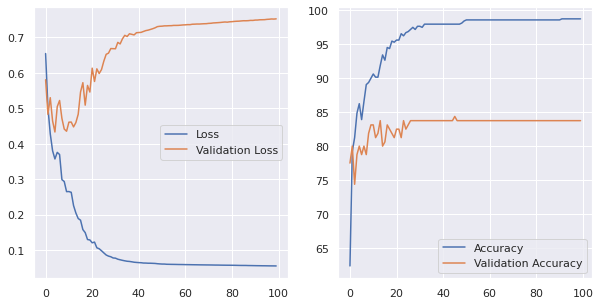

In [44]:
# Create a 1x2 grid of subplots for visualizing training metrics
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 5))

# Plot the training loss and validation loss on the first subplot (ax1)
ax1.plot(history.history['loss'], '-', label = 'Loss')
ax1.plot(history.history['val_loss'], '-', label = 'Validation Loss')
ax1.legend()

# Plot the training accuracy and validation accuracy on the second subplot (ax2)
ax2.plot(100 * np.array(history.history['accuracy']), '-', 
         label = 'Accuracy')
ax2.plot(100 * np.array(history.history['val_accuracy']), '-',
         label = 'Validation Accuracy')
ax2.legend();

# Testing the model
This code evaluates the performance of the loaded neural network model on the test set by generating and visualizing a confusion matrix. The thresholding step suggests a binary classification problem, and the heatmap provides insights into the model's ability to correctly classify instances into true positive, true negative, false positive, and false negative categories.

Text(0.5, 1.0, 'Confusion Matrix')

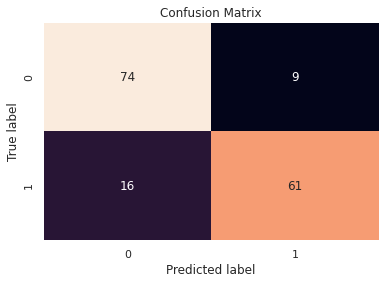

In [56]:
from keras.models import load_model
from sklearn.metrics import confusion_matrix

# Load the pre-trained model
model = load_model("/kaggle/working/BEST_mlp1.h5", compile=False)

# Make predictions on the test set
preds=model.predict(Xtest)

# Initialize empty lists for predicted labels and a threshold
x=[]
z=[]

# Thresholding predictions and storing in 'z'
for i in range(160):
    x=preds[i]
    if x[0]>x[1]:
        x=0
    else:
        x=1
    z.append(x)
len(z)

# Create a confusion matrix based on true labels 'ytest' and predicted labels 'z'
cm = confusion_matrix(ytest,z)

# Plot the confusion matrix using seaborn heatmap
sns.heatmap(cm, annot=True, cbar=False)

# Set labels and title for the plot
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

The classification_report function provides a breakdown of model performance metrics including precision, recall, F1-score, and support for each class.It helps assess the model's ability to correctly classify Tuberculosis negative and positive cases.

In [57]:
from sklearn.metrics import classification_report
LABELS = [
    'Tuberculosis negative cases',
    'Tuberculosis positive cases',

]
print(classification_report(y_true = ytest, y_pred = z,target_names=LABELS))

                             precision    recall  f1-score   support

Tuberculosis negative cases       0.82      0.89      0.86        83
Tuberculosis positive cases       0.87      0.79      0.83        77

                   accuracy                           0.84       160
                  macro avg       0.85      0.84      0.84       160
               weighted avg       0.85      0.84      0.84       160



In [58]:
# Calculating L2 norms for feature normalization

norms = np.linalg.norm(features_array, axis = 1, keepdims=True)

# Normalizing the feature array using L2 norms
X_norm = features_array/norms
X_norm.shape

(800, 2048)

In [64]:

# Splitting the normalized feature array and labels into training and testing sets

Xtrain2, Xtest2, ytrain2, ytest2 = train_test_split(X_norm, y, test_size=0.2)

# Process the model again

In [65]:
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint


# Specify the file path to save the best weights of the model
weight_path="{}_mlp2.h5".format('BEST')

# Reduce learning rate when a monitored metric has stopped improving
reduceLROnPlat = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, 
                                   patience=4, 
                                   verbose=1, mode='min', epsilon=0.0001, cooldown=2, min_lr=1e-6)


# Save the best model weights during training
checkpoint = ModelCheckpoint(weight_path, monitor='val_accuracy', verbose=1, 
                             save_best_only=True, mode='auto')

# List of callbacks to be applied during training
callbacks_list = [checkpoint, reduceLROnPlat]

In [66]:
import keras 
import random
from keras.models import Sequential
from keras.layers import Dense

random.seed(1)
np.random.seed(1)
tf.random.set_seed(1)

model = Sequential()
model.add(Dense(200, input_shape=(2048,), activation='relu'))
model.add(Dense(120, activation='relu'))
model.add(Dense(80, activation='relu'))
model.add(Dense(50, activation='relu'))
model.add(Dense(20, activation='relu'))
model.add(Dense(5, activation='relu'))
model.add(Dense(2, activation='softmax'))
model.compile(loss='sparse_categorical_crossentropy',optimizer=tf.keras.optimizers.Adam(), metrics=['accuracy'])
history=model.fit(Xtrain2,ytrain2, epochs=100, batch_size=8, verbose=1,validation_data=(Xtest2, ytest2), callbacks=callbacks_list)

Epoch 1/100
79/80 [============================>.] - ETA: 0s - loss: 0.6511 - accuracy: 0.5870
Epoch 00001: val_accuracy improved from -inf to 0.78750, saving model to BEST_mlp2.h5
80/80 [==============================] - 0s 4ms/step - loss: 0.6539 - accuracy: 0.5859 - val_loss: 0.5666 - val_accuracy: 0.7875 - lr: 0.0010
Epoch 2/100
54/80 [===================>..........] - ETA: 0s - loss: 0.4914 - accuracy: 0.8148
Epoch 00002: val_accuracy did not improve from 0.78750
80/80 [==============================] - 0s 3ms/step - loss: 0.5192 - accuracy: 0.7906 - val_loss: 0.4976 - val_accuracy: 0.7812 - lr: 0.0010
Epoch 3/100
79/80 [============================>.] - ETA: 0s - loss: 0.4461 - accuracy: 0.8180
Epoch 00003: val_accuracy did not improve from 0.78750
80/80 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.8188 - val_loss: 0.5198 - val_accuracy: 0.7437 - lr: 0.0010
Epoch 4/100
54/80 [===================>..........] - ETA: 0s - loss: 0.3753 - accuracy: 0.847

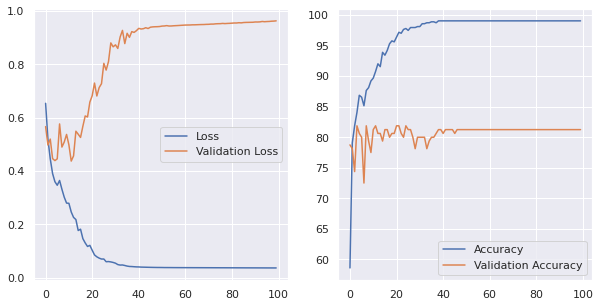

In [67]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 5))
ax1.plot(history.history['loss'], '-', label = 'Loss')
ax1.plot(history.history['val_loss'], '-', label = 'Validation Loss')
ax1.legend()

ax2.plot(100 * np.array(history.history['accuracy']), '-', 
         label = 'Accuracy')
ax2.plot(100 * np.array(history.history['val_accuracy']), '-',
         label = 'Validation Accuracy')
ax2.legend();


Text(0.5, 1.0, 'Confusion Matrix')

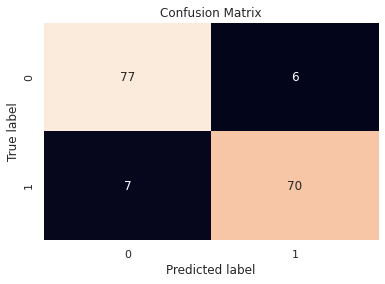

In [68]:
from keras.models import load_model
model = load_model("/kaggle/working/BEST_mlp1.h5", compile=False)
preds=model.predict(Xtest2)
x=[]
z=[]
for i in range(160):
    x=preds[i]
    if x[0]>x[1]:
        x=0
    else:
        x=1
    z.append(x)
len(z)
cm = confusion_matrix(ytest2,z)
sns.heatmap(cm, annot=True, cbar=False)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

In [69]:
from sklearn.metrics import classification_report
print(classification_report(ytest2, z))

              precision    recall  f1-score   support

           0       0.92      0.93      0.92        83
           1       0.92      0.91      0.92        77

    accuracy                           0.92       160
   macro avg       0.92      0.92      0.92       160
weighted avg       0.92      0.92      0.92       160



The model is trained and evaluated twice. This might be done for different purposes, such as comparing the performance of the model under different conditions, applying different preprocessing techniques, or training variations of the same model.

Let's break down the process:

First Model Training (mlp1):

The first set of code involves training a multi-layer perceptron (MLP) model (model) with a specific architecture and hyperparameters.
The training is performed using the features obtained from a pre-trained ResNet50 model.

Second Model Training (mlp2):

After the first model (mlp1) is trained, the code normalizes the features obtained from the ResNet50 model (features_array) and splits the data into training and testing sets (Xtrain2, Xtest2, ytrain2, ytest2).
Then, a new MLP model (model) is defined with a different architecture, specifically designed for the normalized features.
This new model is trained using the normalized features.

Reasons for Processing the Model Twice:

The two sets of training  performed to compare the performance of the model before and after normalization.And we are seeing here significance difference in accuracy.


Implemented a neural network using Keras for a classification task with two output classes.The provided code comprises several crucial sections for training, evaluating, and analyzing the performance of a neural network. The training details section establishes key training parameters, such as the number of epochs, a learning rate schedule for optimization, and a model checkpoint to save the best weights during training. The subsequent training output section reveals the model's progression over epochs, displaying training and validation metrics. This aids in assessing the model's convergence and performance trends. The model evaluation on the test set section loads the best-performing model based on validation accuracy and applies it to make predictions on the unseen test data. The confusion matrix and classification report generated in this section offer a comprehensive evaluation of the model's classification performance across different classes. Collectively, these sections contribute to a thorough training, evaluation, and analysis pipeline, ensuring the neural network effectively learns patterns in the data and generalizes well to new, unseen examples

# Why needed this modeling techniques in this project:

The choice of a Convolutional Neural Network (CNN) for this project is likely motivated by the nature of the task, which is image classification. CNNs have proven to be highly effective in image-related tasks due to their ability to automatically learn hierarchical features from the input data.

Here are some key reasons why the modeling technique of CNNs is appropriate for this project:

Spatial Hierarchies in Images: CNNs are designed to capture spatial hierarchies in data, which is crucial for image understanding. They can automatically learn features at different levels of abstraction, starting from simple edges and textures to complex patterns and objects.

Translation Invariance: CNNs are inherently translation-invariant, meaning they can recognize patterns regardless of their position in the image. This is particularly important for tasks like image classification where the position of an object in the image should not affect the model's ability to recognize it.

Shared Weight Scheme: CNNs use a shared weight scheme through convolutional filters, which significantly reduces the number of parameters compared to fully connected networks. This makes CNNs computationally efficient and helps in handling the high dimensionality of image data.

Pooling for Dimensionality Reduction: The use of pooling layers helps in reducing the spatial dimensions of the data while retaining important features. This not only reduces computational complexity but also helps in creating a more abstract and generalized representation of the input.

Previous Success in Image Classification: CNNs have demonstrated remarkable success in image classification tasks, especially in competitions like ImageNet. Their ability to automatically learn relevant features from raw pixel data makes them a go-to choice for image-related tasks.

Data Augmentation: The inclusion of data augmentation in the training process, as seen in the code, further enhances the model's ability to generalize by exposing it to various transformations of the training images. This helps the model become robust to diverse real-world scenarios.

In summary, the use of CNNs in this project aligns with the specific requirements of image classification tasks, taking advantage of their ability to automatically learn hierarchical features, handle spatial hierarchies, and provide robust and accurate predictions for images.